# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [2]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [3]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [4]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [5]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

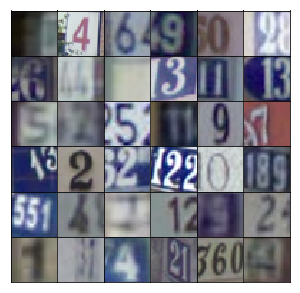

In [6]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [7]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [8]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [9]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [10]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*512)
        
        # Reshape to enter into the conv stack
        x=tf.reshape(x, (-1, 4, 4, 512))
        x=tf.layers.batch_normalization(x, training=training)
        x=tf.maximum(x, alpha*x)
        # Now we are at 4*4*512
        
        conv1 = tf.layers.conv2d_transpose(
                inputs=x, 
                filters=256,
                kernel_size=[5,5],
                strides=2,
                padding="same")
        conv1=tf.layers.batch_normalization(conv1, training=training)
        conv1=tf.maximum(alpha*conv1, conv1)
        # 8*8*256
        
        conv2 = tf.layers.conv2d_transpose(
                inputs=conv1, 
                filters=128,
                kernel_size=[5,5],
                strides=2,
                padding="same")
        conv2 =tf.layers.batch_normalization(conv2, training=training)
        conv2 =tf.maximum(alpha*conv2, conv2) 
        # 16*16*128
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(
                    inputs=conv2,
                    filters=output_dim,
                    kernel_size=[5,5],
                    strides=2,
                    padding="same")
        
        out = tf.tanh(logits)
        
        return out

### Some Points to Note:

+ Every time we do strides of "2" , we increase the width and the height by double , this is due to padding also
+ Please go through the simple convnn architecture for MNIST using TF to understand this , Do the below 
 - https://www.tensorflow.org/versions/master/tutorials/layers
+ The need for transposed convolutions generally arises from the desire to use a transformation going in the opposite direction of a normal convolution, i.e., from something that has the shape of the output of some convolution to something that has the shape of its input while maintaining a connectivity pattern that is compatible with said convolution. Basically we are increasing the height and width for each layer while we are doing transpose convolution , generally the normal behavior is decreasing in the height and width and increasing in the depth , which happens in a normal Convolution classifier as in the ```Discriminator``` below

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [12]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3        
        
        # 1st Conv Layer
        conv1 = tf.layers.conv2d(
        inputs=x,
        filters=64,
        kernel_size=[5,5],
        strides=2,
        padding="same")
        # size here : 16*16*64
        conv1 = tf.maximum(conv1, alpha*conv1)
        
        #2nd Conv layer
        conv2 = tf.layers.conv2d(
        inputs=conv1,
        filters=128,
        kernel_size=[5,5],
        strides=2,
        padding="same")
        conv2 = tf.layers.batch_normalization(conv2, training=True)
        conv2 = tf.maximum(conv2, alpha*conv2)
        #size here : 8*8*128
        
        conv3 = tf.layers.conv2d(
        inputs=conv2,
        filters=256,
        kernel_size=[5,5],
        strides=2,
        padding="same")
        conv3=tf.layers.batch_normalization(conv3, training=True)
        conv3 = tf.maximum(conv3, alpha*conv3)
        #size here 4*4*256
        
        #Flatten it
        flat = tf.reshape(conv3, (-1, 4*4*256))
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [13]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [14]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [15]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [16]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [17]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [18]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 6
alpha = 0.2
beta1 = 0.6

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/6... Discriminator Loss: 1.3403... Generator Loss: 0.7415
Epoch 1/6... Discriminator Loss: 0.4220... Generator Loss: 1.8907
Epoch 1/6... Discriminator Loss: 0.2671... Generator Loss: 1.7491
Epoch 1/6... Discriminator Loss: 0.1637... Generator Loss: 2.4748
Epoch 1/6... Discriminator Loss: 0.1713... Generator Loss: 2.9086
Epoch 1/6... Discriminator Loss: 0.1055... Generator Loss: 2.8016
Epoch 1/6... Discriminator Loss: 0.0888... Generator Loss: 3.5055
Epoch 1/6... Discriminator Loss: 0.1043... Generator Loss: 3.2575
Epoch 1/6... Discriminator Loss: 0.1491... Generator Loss: 2.7843
Epoch 1/6... Discriminator Loss: 0.1634... Generator Loss: 2.8882


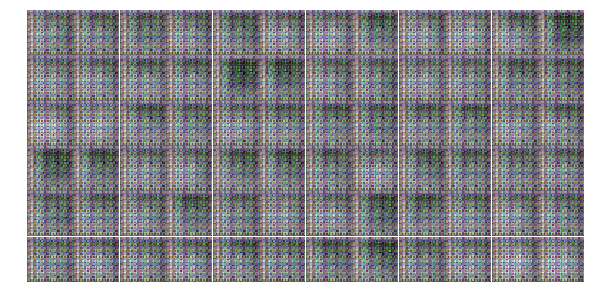

Epoch 1/6... Discriminator Loss: 1.1132... Generator Loss: 4.0920
Epoch 1/6... Discriminator Loss: 0.3665... Generator Loss: 2.3086
Epoch 1/6... Discriminator Loss: 0.5367... Generator Loss: 1.7290
Epoch 1/6... Discriminator Loss: 0.3823... Generator Loss: 2.5342
Epoch 1/6... Discriminator Loss: 0.2894... Generator Loss: 2.4199
Epoch 1/6... Discriminator Loss: 0.2661... Generator Loss: 2.4060
Epoch 1/6... Discriminator Loss: 0.3584... Generator Loss: 1.5924
Epoch 1/6... Discriminator Loss: 0.2292... Generator Loss: 3.0649
Epoch 1/6... Discriminator Loss: 0.2613... Generator Loss: 2.8405
Epoch 1/6... Discriminator Loss: 0.1387... Generator Loss: 3.0846


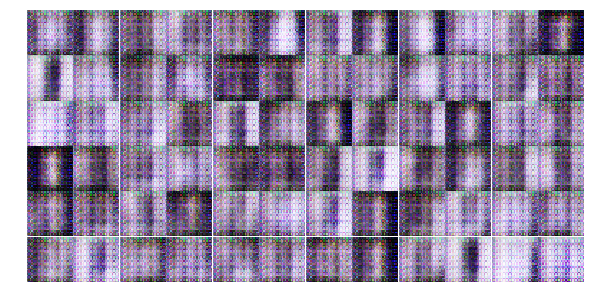

Epoch 1/6... Discriminator Loss: 0.4206... Generator Loss: 1.5475
Epoch 1/6... Discriminator Loss: 0.5559... Generator Loss: 2.5608
Epoch 1/6... Discriminator Loss: 0.2950... Generator Loss: 1.9545
Epoch 1/6... Discriminator Loss: 0.6335... Generator Loss: 1.0199
Epoch 1/6... Discriminator Loss: 1.4686... Generator Loss: 4.0821
Epoch 1/6... Discriminator Loss: 2.1392... Generator Loss: 4.0249
Epoch 1/6... Discriminator Loss: 0.9004... Generator Loss: 1.5341
Epoch 1/6... Discriminator Loss: 0.9143... Generator Loss: 1.3174
Epoch 1/6... Discriminator Loss: 0.4226... Generator Loss: 1.6633
Epoch 1/6... Discriminator Loss: 0.4332... Generator Loss: 1.6925


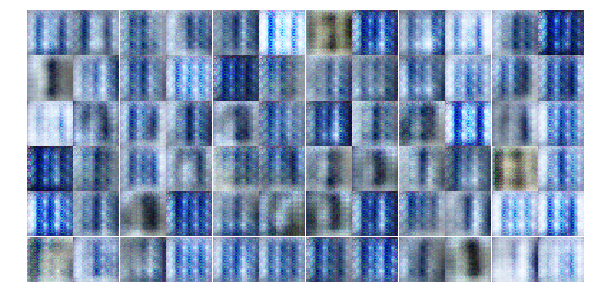

Epoch 1/6... Discriminator Loss: 1.2570... Generator Loss: 0.6282
Epoch 1/6... Discriminator Loss: 0.7655... Generator Loss: 1.4154
Epoch 1/6... Discriminator Loss: 0.5716... Generator Loss: 1.7128
Epoch 1/6... Discriminator Loss: 0.7016... Generator Loss: 1.6181
Epoch 1/6... Discriminator Loss: 0.5325... Generator Loss: 1.3908
Epoch 1/6... Discriminator Loss: 0.4561... Generator Loss: 2.0728
Epoch 1/6... Discriminator Loss: 0.6929... Generator Loss: 1.3379
Epoch 1/6... Discriminator Loss: 0.5436... Generator Loss: 1.9580
Epoch 1/6... Discriminator Loss: 0.9188... Generator Loss: 1.3724
Epoch 1/6... Discriminator Loss: 0.7077... Generator Loss: 1.2714


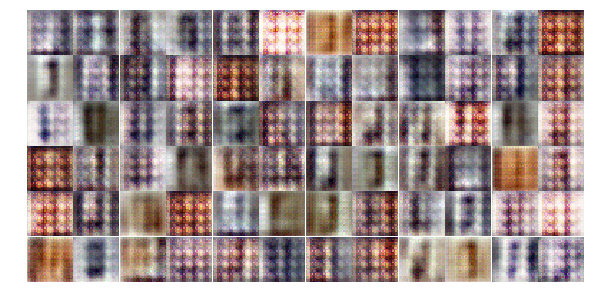

Epoch 1/6... Discriminator Loss: 0.6182... Generator Loss: 1.7510
Epoch 1/6... Discriminator Loss: 0.4526... Generator Loss: 2.0671
Epoch 1/6... Discriminator Loss: 0.7838... Generator Loss: 1.0533
Epoch 1/6... Discriminator Loss: 0.5247... Generator Loss: 2.2147
Epoch 1/6... Discriminator Loss: 0.7276... Generator Loss: 1.2623
Epoch 1/6... Discriminator Loss: 0.4781... Generator Loss: 1.9311
Epoch 1/6... Discriminator Loss: 0.7417... Generator Loss: 1.3836
Epoch 1/6... Discriminator Loss: 0.6222... Generator Loss: 1.4389
Epoch 1/6... Discriminator Loss: 0.8316... Generator Loss: 1.1695
Epoch 1/6... Discriminator Loss: 0.8743... Generator Loss: 2.2298


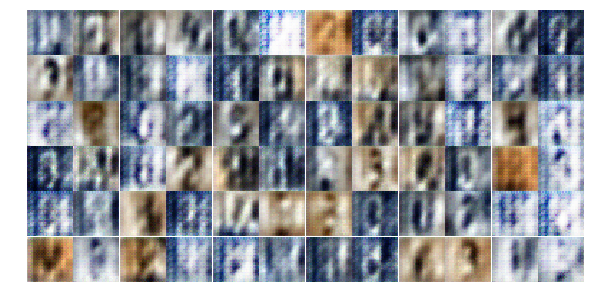

Epoch 1/6... Discriminator Loss: 0.8678... Generator Loss: 1.3143
Epoch 1/6... Discriminator Loss: 0.8181... Generator Loss: 1.3673
Epoch 1/6... Discriminator Loss: 0.9457... Generator Loss: 1.2841
Epoch 1/6... Discriminator Loss: 1.1119... Generator Loss: 0.9573
Epoch 1/6... Discriminator Loss: 1.0420... Generator Loss: 1.5379
Epoch 1/6... Discriminator Loss: 0.9302... Generator Loss: 1.2473
Epoch 1/6... Discriminator Loss: 0.6705... Generator Loss: 1.7889
Epoch 2/6... Discriminator Loss: 0.6521... Generator Loss: 1.5717
Epoch 2/6... Discriminator Loss: 0.3996... Generator Loss: 2.1548
Epoch 2/6... Discriminator Loss: 0.6082... Generator Loss: 1.8851


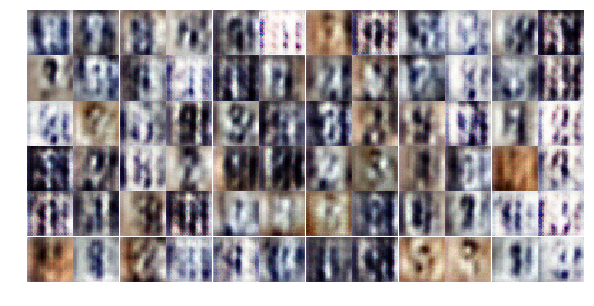

Epoch 2/6... Discriminator Loss: 0.5447... Generator Loss: 1.7012
Epoch 2/6... Discriminator Loss: 0.7935... Generator Loss: 1.3914
Epoch 2/6... Discriminator Loss: 0.5956... Generator Loss: 1.4920
Epoch 2/6... Discriminator Loss: 0.3955... Generator Loss: 1.9965
Epoch 2/6... Discriminator Loss: 0.7574... Generator Loss: 1.1368
Epoch 2/6... Discriminator Loss: 0.7465... Generator Loss: 1.5073
Epoch 2/6... Discriminator Loss: 0.7625... Generator Loss: 1.3926
Epoch 2/6... Discriminator Loss: 0.5406... Generator Loss: 1.8281
Epoch 2/6... Discriminator Loss: 1.2853... Generator Loss: 1.0667
Epoch 2/6... Discriminator Loss: 0.7545... Generator Loss: 1.2021


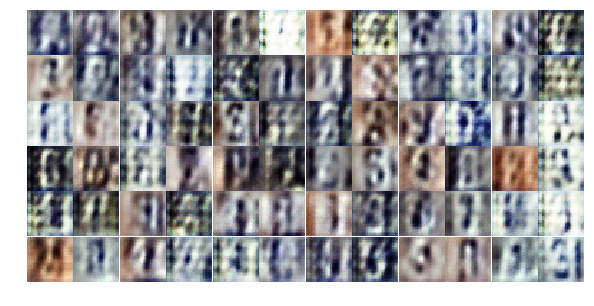

Epoch 2/6... Discriminator Loss: 0.7566... Generator Loss: 1.5950
Epoch 2/6... Discriminator Loss: 1.0508... Generator Loss: 1.2103
Epoch 2/6... Discriminator Loss: 0.6718... Generator Loss: 1.8739
Epoch 2/6... Discriminator Loss: 0.7328... Generator Loss: 1.3107
Epoch 2/6... Discriminator Loss: 0.7947... Generator Loss: 1.2815
Epoch 2/6... Discriminator Loss: 0.8980... Generator Loss: 1.0398
Epoch 2/6... Discriminator Loss: 1.0173... Generator Loss: 1.2241
Epoch 2/6... Discriminator Loss: 1.2865... Generator Loss: 0.8445
Epoch 2/6... Discriminator Loss: 1.0964... Generator Loss: 1.1835
Epoch 2/6... Discriminator Loss: 0.6142... Generator Loss: 1.6650


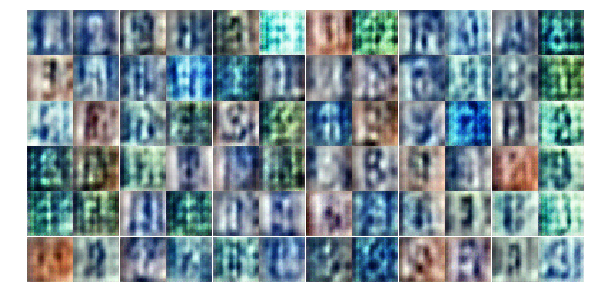

Epoch 2/6... Discriminator Loss: 0.9944... Generator Loss: 0.8446
Epoch 2/6... Discriminator Loss: 1.3795... Generator Loss: 0.6930
Epoch 2/6... Discriminator Loss: 0.9304... Generator Loss: 1.1945
Epoch 2/6... Discriminator Loss: 0.8450... Generator Loss: 1.1235
Epoch 2/6... Discriminator Loss: 1.0326... Generator Loss: 1.3165
Epoch 2/6... Discriminator Loss: 1.5732... Generator Loss: 0.7087
Epoch 2/6... Discriminator Loss: 0.8336... Generator Loss: 1.2643
Epoch 2/6... Discriminator Loss: 0.8997... Generator Loss: 1.2896
Epoch 2/6... Discriminator Loss: 1.0424... Generator Loss: 0.9978
Epoch 2/6... Discriminator Loss: 1.3368... Generator Loss: 0.8500


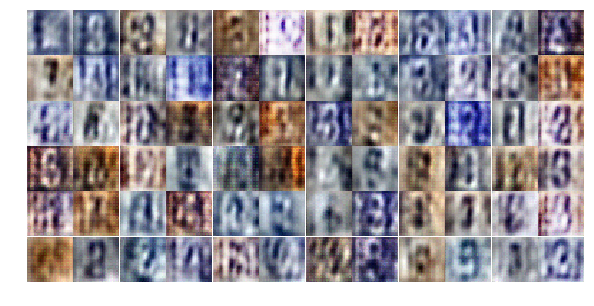

Epoch 2/6... Discriminator Loss: 1.0284... Generator Loss: 0.9769
Epoch 2/6... Discriminator Loss: 0.9760... Generator Loss: 1.2171
Epoch 2/6... Discriminator Loss: 1.5105... Generator Loss: 0.7330
Epoch 2/6... Discriminator Loss: 1.2474... Generator Loss: 0.8520
Epoch 2/6... Discriminator Loss: 1.0654... Generator Loss: 1.2132
Epoch 2/6... Discriminator Loss: 1.0563... Generator Loss: 0.9584
Epoch 2/6... Discriminator Loss: 1.1254... Generator Loss: 1.1151
Epoch 2/6... Discriminator Loss: 0.8834... Generator Loss: 1.0890
Epoch 2/6... Discriminator Loss: 0.9647... Generator Loss: 0.8831
Epoch 2/6... Discriminator Loss: 1.1466... Generator Loss: 0.9735


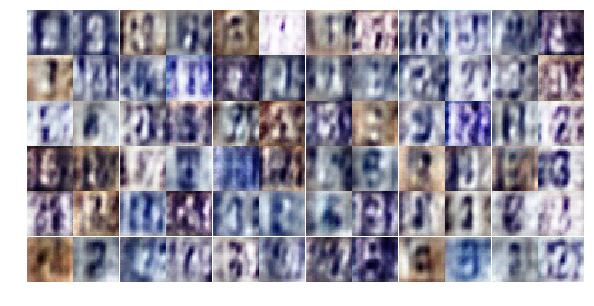

Epoch 2/6... Discriminator Loss: 1.0317... Generator Loss: 1.1134
Epoch 2/6... Discriminator Loss: 1.1719... Generator Loss: 1.2121
Epoch 2/6... Discriminator Loss: 1.0373... Generator Loss: 0.8026
Epoch 2/6... Discriminator Loss: 1.1746... Generator Loss: 0.8696
Epoch 2/6... Discriminator Loss: 1.1306... Generator Loss: 1.0352
Epoch 2/6... Discriminator Loss: 1.4036... Generator Loss: 0.5967
Epoch 2/6... Discriminator Loss: 0.9160... Generator Loss: 0.9725
Epoch 2/6... Discriminator Loss: 0.9975... Generator Loss: 0.9310
Epoch 2/6... Discriminator Loss: 0.8587... Generator Loss: 1.1177
Epoch 2/6... Discriminator Loss: 0.9798... Generator Loss: 1.1906


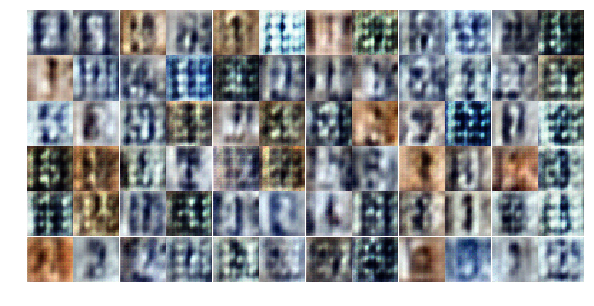

Epoch 2/6... Discriminator Loss: 0.9481... Generator Loss: 1.0572
Epoch 2/6... Discriminator Loss: 0.9276... Generator Loss: 1.1740
Epoch 2/6... Discriminator Loss: 1.2945... Generator Loss: 0.7525
Epoch 2/6... Discriminator Loss: 1.2806... Generator Loss: 0.9090
Epoch 3/6... Discriminator Loss: 1.0844... Generator Loss: 1.1389
Epoch 3/6... Discriminator Loss: 1.2378... Generator Loss: 0.8114
Epoch 3/6... Discriminator Loss: 1.1181... Generator Loss: 0.9825
Epoch 3/6... Discriminator Loss: 1.2144... Generator Loss: 0.9610
Epoch 3/6... Discriminator Loss: 0.8371... Generator Loss: 1.0689
Epoch 3/6... Discriminator Loss: 1.4325... Generator Loss: 0.8340


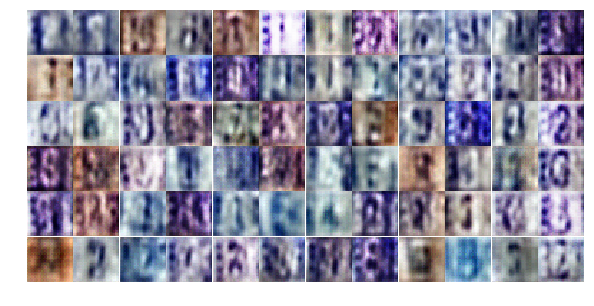

Epoch 3/6... Discriminator Loss: 0.9928... Generator Loss: 0.9596
Epoch 3/6... Discriminator Loss: 1.1164... Generator Loss: 0.8782
Epoch 3/6... Discriminator Loss: 1.1715... Generator Loss: 0.9592
Epoch 3/6... Discriminator Loss: 1.1173... Generator Loss: 1.0923
Epoch 3/6... Discriminator Loss: 1.0371... Generator Loss: 1.0124
Epoch 3/6... Discriminator Loss: 1.1452... Generator Loss: 1.1492
Epoch 3/6... Discriminator Loss: 1.0618... Generator Loss: 1.1863
Epoch 3/6... Discriminator Loss: 0.9409... Generator Loss: 0.9236
Epoch 3/6... Discriminator Loss: 1.1092... Generator Loss: 0.8161
Epoch 3/6... Discriminator Loss: 1.1466... Generator Loss: 0.9341


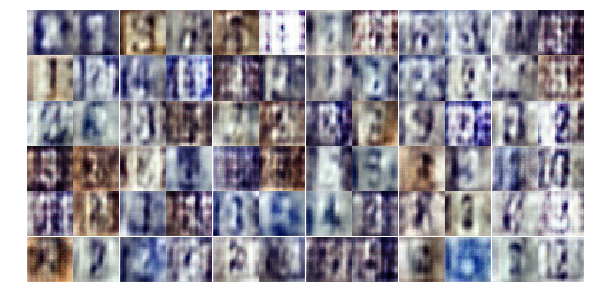

Epoch 3/6... Discriminator Loss: 0.9270... Generator Loss: 1.0576
Epoch 3/6... Discriminator Loss: 0.8827... Generator Loss: 1.1341
Epoch 3/6... Discriminator Loss: 1.1776... Generator Loss: 1.0539
Epoch 3/6... Discriminator Loss: 1.1155... Generator Loss: 1.1797
Epoch 3/6... Discriminator Loss: 1.0931... Generator Loss: 0.8298
Epoch 3/6... Discriminator Loss: 1.1534... Generator Loss: 1.1406
Epoch 3/6... Discriminator Loss: 1.0180... Generator Loss: 1.1005
Epoch 3/6... Discriminator Loss: 1.1385... Generator Loss: 0.8924
Epoch 3/6... Discriminator Loss: 0.9915... Generator Loss: 1.0462
Epoch 3/6... Discriminator Loss: 0.9248... Generator Loss: 1.2276


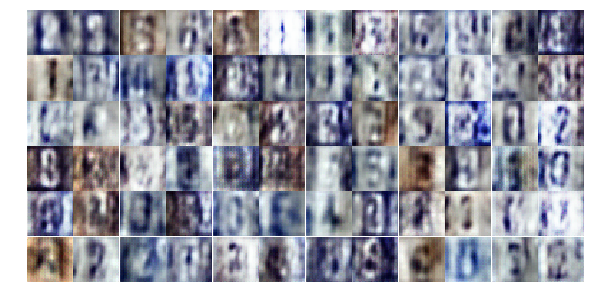

Epoch 3/6... Discriminator Loss: 1.3117... Generator Loss: 1.0184
Epoch 3/6... Discriminator Loss: 0.8416... Generator Loss: 1.1317
Epoch 3/6... Discriminator Loss: 0.9680... Generator Loss: 0.9321
Epoch 3/6... Discriminator Loss: 0.7951... Generator Loss: 0.9212
Epoch 3/6... Discriminator Loss: 0.8751... Generator Loss: 1.1526
Epoch 3/6... Discriminator Loss: 1.0695... Generator Loss: 0.9182
Epoch 3/6... Discriminator Loss: 0.9089... Generator Loss: 1.9285
Epoch 3/6... Discriminator Loss: 0.8690... Generator Loss: 1.4946
Epoch 3/6... Discriminator Loss: 0.8743... Generator Loss: 1.6940
Epoch 3/6... Discriminator Loss: 0.7740... Generator Loss: 1.1234


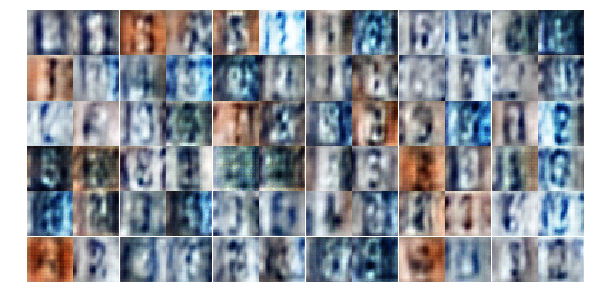

Epoch 3/6... Discriminator Loss: 0.9730... Generator Loss: 1.1867
Epoch 3/6... Discriminator Loss: 0.7248... Generator Loss: 1.1271
Epoch 3/6... Discriminator Loss: 0.8028... Generator Loss: 1.4226
Epoch 3/6... Discriminator Loss: 0.9732... Generator Loss: 0.7968
Epoch 3/6... Discriminator Loss: 0.8962... Generator Loss: 2.1031
Epoch 3/6... Discriminator Loss: 0.7238... Generator Loss: 1.0994
Epoch 3/6... Discriminator Loss: 0.7631... Generator Loss: 1.5581
Epoch 3/6... Discriminator Loss: 0.7477... Generator Loss: 1.3968
Epoch 3/6... Discriminator Loss: 0.9028... Generator Loss: 1.7471
Epoch 3/6... Discriminator Loss: 1.0114... Generator Loss: 0.8493


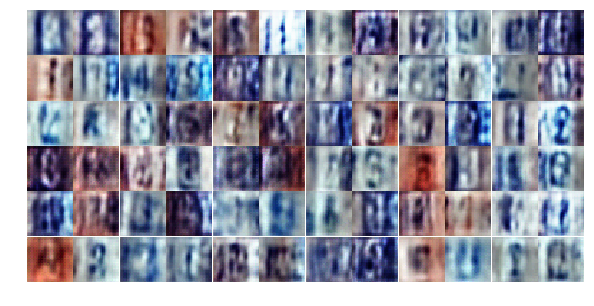

Epoch 3/6... Discriminator Loss: 0.7825... Generator Loss: 1.1055
Epoch 3/6... Discriminator Loss: 0.6026... Generator Loss: 1.5485
Epoch 3/6... Discriminator Loss: 1.0834... Generator Loss: 0.7822
Epoch 3/6... Discriminator Loss: 0.9468... Generator Loss: 1.1733
Epoch 3/6... Discriminator Loss: 0.5858... Generator Loss: 1.9703
Epoch 3/6... Discriminator Loss: 0.8197... Generator Loss: 1.9082
Epoch 3/6... Discriminator Loss: 0.5050... Generator Loss: 1.6788
Epoch 3/6... Discriminator Loss: 0.5704... Generator Loss: 1.9651
Epoch 3/6... Discriminator Loss: 0.6753... Generator Loss: 1.1233
Epoch 3/6... Discriminator Loss: 1.1957... Generator Loss: 0.6794


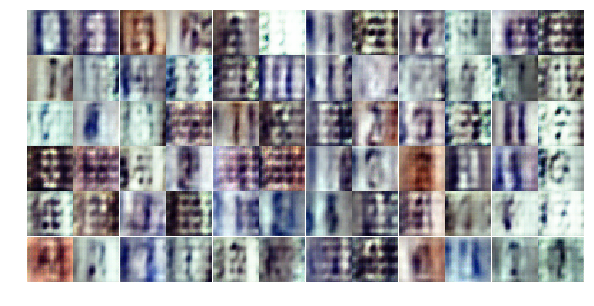

Epoch 3/6... Discriminator Loss: 1.0419... Generator Loss: 1.1470
Epoch 4/6... Discriminator Loss: 0.6646... Generator Loss: 1.2423
Epoch 4/6... Discriminator Loss: 0.8203... Generator Loss: 1.1605
Epoch 4/6... Discriminator Loss: 0.9995... Generator Loss: 0.9357
Epoch 4/6... Discriminator Loss: 0.6834... Generator Loss: 1.5352
Epoch 4/6... Discriminator Loss: 0.5181... Generator Loss: 1.5102
Epoch 4/6... Discriminator Loss: 0.7275... Generator Loss: 1.0431
Epoch 4/6... Discriminator Loss: 0.5656... Generator Loss: 1.7096
Epoch 4/6... Discriminator Loss: 0.5294... Generator Loss: 2.4065
Epoch 4/6... Discriminator Loss: 0.5036... Generator Loss: 2.0822


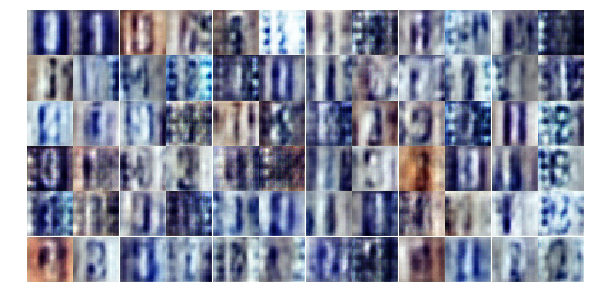

Epoch 4/6... Discriminator Loss: 0.5135... Generator Loss: 1.5974
Epoch 4/6... Discriminator Loss: 0.7808... Generator Loss: 0.9488
Epoch 4/6... Discriminator Loss: 0.6602... Generator Loss: 1.2419
Epoch 4/6... Discriminator Loss: 0.8523... Generator Loss: 1.0122
Epoch 4/6... Discriminator Loss: 0.9722... Generator Loss: 1.4231
Epoch 4/6... Discriminator Loss: 1.1043... Generator Loss: 0.6282
Epoch 4/6... Discriminator Loss: 0.5499... Generator Loss: 1.5639
Epoch 4/6... Discriminator Loss: 0.5144... Generator Loss: 1.6485
Epoch 4/6... Discriminator Loss: 0.6768... Generator Loss: 1.2749
Epoch 4/6... Discriminator Loss: 0.3774... Generator Loss: 2.0910


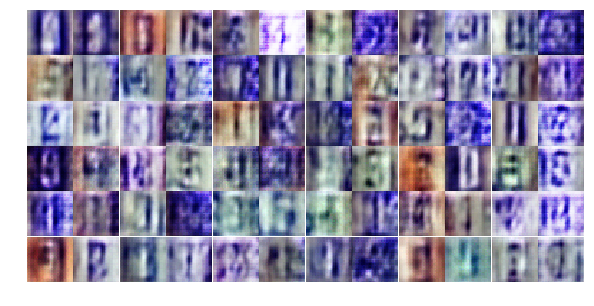

Epoch 4/6... Discriminator Loss: 0.8453... Generator Loss: 1.9972
Epoch 4/6... Discriminator Loss: 0.7317... Generator Loss: 2.3737
Epoch 4/6... Discriminator Loss: 0.8350... Generator Loss: 0.9914
Epoch 4/6... Discriminator Loss: 0.6640... Generator Loss: 1.4827
Epoch 4/6... Discriminator Loss: 0.6478... Generator Loss: 1.4078
Epoch 4/6... Discriminator Loss: 0.6200... Generator Loss: 1.8833
Epoch 4/6... Discriminator Loss: 0.5608... Generator Loss: 2.5939
Epoch 4/6... Discriminator Loss: 1.3685... Generator Loss: 0.4729
Epoch 4/6... Discriminator Loss: 0.4494... Generator Loss: 2.1354
Epoch 4/6... Discriminator Loss: 0.6073... Generator Loss: 1.3183


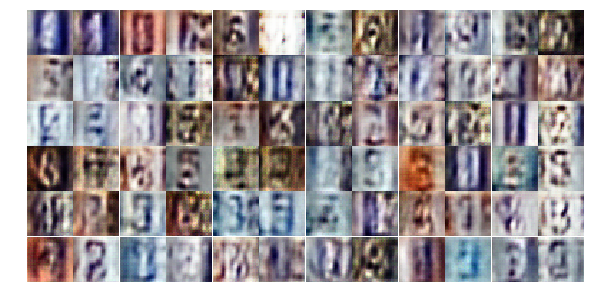

Epoch 4/6... Discriminator Loss: 0.6349... Generator Loss: 1.9323
Epoch 4/6... Discriminator Loss: 0.8190... Generator Loss: 1.3395
Epoch 4/6... Discriminator Loss: 0.5107... Generator Loss: 1.6940
Epoch 4/6... Discriminator Loss: 0.5527... Generator Loss: 2.0680
Epoch 4/6... Discriminator Loss: 0.5724... Generator Loss: 1.9159
Epoch 4/6... Discriminator Loss: 0.5814... Generator Loss: 1.4929
Epoch 4/6... Discriminator Loss: 0.7193... Generator Loss: 1.2627
Epoch 4/6... Discriminator Loss: 0.5224... Generator Loss: 2.0985
Epoch 4/6... Discriminator Loss: 0.8069... Generator Loss: 1.1732
Epoch 4/6... Discriminator Loss: 0.6174... Generator Loss: 2.4112


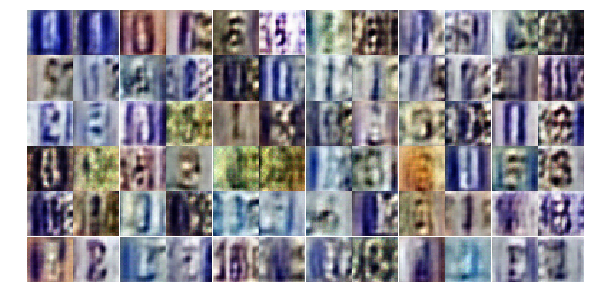

Epoch 4/6... Discriminator Loss: 1.0733... Generator Loss: 0.9720
Epoch 4/6... Discriminator Loss: 0.5614... Generator Loss: 1.4809
Epoch 4/6... Discriminator Loss: 0.5268... Generator Loss: 1.6413
Epoch 4/6... Discriminator Loss: 0.6450... Generator Loss: 1.2217
Epoch 4/6... Discriminator Loss: 0.5204... Generator Loss: 2.0767
Epoch 4/6... Discriminator Loss: 0.5415... Generator Loss: 1.2986
Epoch 4/6... Discriminator Loss: 0.9475... Generator Loss: 0.8332
Epoch 4/6... Discriminator Loss: 0.7611... Generator Loss: 1.9484
Epoch 4/6... Discriminator Loss: 0.6735... Generator Loss: 1.4950
Epoch 4/6... Discriminator Loss: 1.0305... Generator Loss: 0.8462


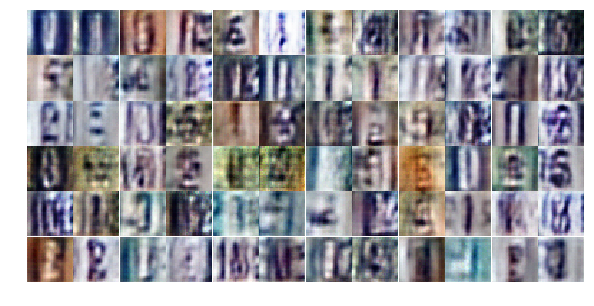

Epoch 4/6... Discriminator Loss: 0.5776... Generator Loss: 1.6139
Epoch 4/6... Discriminator Loss: 1.4738... Generator Loss: 2.2297
Epoch 4/6... Discriminator Loss: 0.8623... Generator Loss: 1.6053
Epoch 4/6... Discriminator Loss: 0.6636... Generator Loss: 1.4618
Epoch 4/6... Discriminator Loss: 0.8243... Generator Loss: 2.0092
Epoch 4/6... Discriminator Loss: 0.7838... Generator Loss: 1.1718
Epoch 4/6... Discriminator Loss: 1.3413... Generator Loss: 0.4509
Epoch 4/6... Discriminator Loss: 0.6204... Generator Loss: 1.5495
Epoch 4/6... Discriminator Loss: 0.7834... Generator Loss: 1.1296
Epoch 5/6... Discriminator Loss: 0.7400... Generator Loss: 1.5748


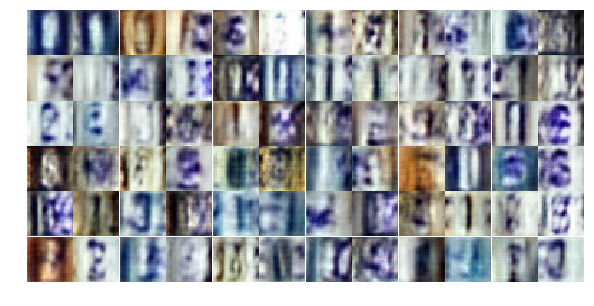

Epoch 5/6... Discriminator Loss: 0.4835... Generator Loss: 1.8497
Epoch 5/6... Discriminator Loss: 0.6430... Generator Loss: 1.9303
Epoch 5/6... Discriminator Loss: 0.9655... Generator Loss: 0.7445
Epoch 5/6... Discriminator Loss: 0.6596... Generator Loss: 1.2118
Epoch 5/6... Discriminator Loss: 0.4093... Generator Loss: 2.0461
Epoch 5/6... Discriminator Loss: 0.5028... Generator Loss: 1.7242
Epoch 5/6... Discriminator Loss: 0.9656... Generator Loss: 0.6805
Epoch 5/6... Discriminator Loss: 0.8063... Generator Loss: 0.9067
Epoch 5/6... Discriminator Loss: 0.6009... Generator Loss: 1.5057
Epoch 5/6... Discriminator Loss: 0.8066... Generator Loss: 0.9718


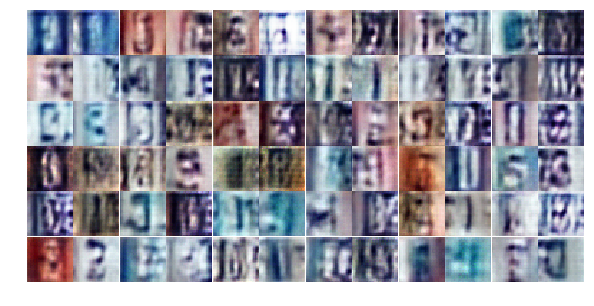

Epoch 5/6... Discriminator Loss: 0.6414... Generator Loss: 1.3635
Epoch 5/6... Discriminator Loss: 0.5827... Generator Loss: 1.2900
Epoch 5/6... Discriminator Loss: 0.5278... Generator Loss: 2.3911
Epoch 5/6... Discriminator Loss: 1.1751... Generator Loss: 0.5215
Epoch 5/6... Discriminator Loss: 0.6703... Generator Loss: 2.1934
Epoch 5/6... Discriminator Loss: 0.6476... Generator Loss: 1.0564
Epoch 5/6... Discriminator Loss: 0.5529... Generator Loss: 1.5051
Epoch 5/6... Discriminator Loss: 0.4309... Generator Loss: 1.4694
Epoch 5/6... Discriminator Loss: 0.5744... Generator Loss: 1.3098
Epoch 5/6... Discriminator Loss: 0.3932... Generator Loss: 2.3296


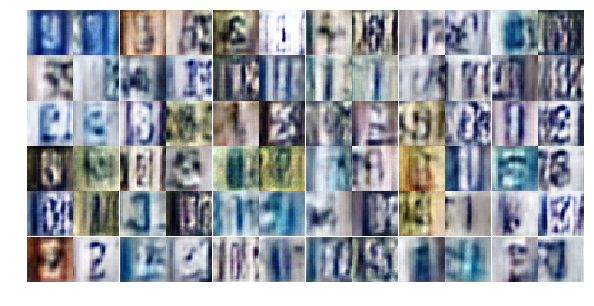

Epoch 5/6... Discriminator Loss: 0.4401... Generator Loss: 1.8228
Epoch 5/6... Discriminator Loss: 0.7525... Generator Loss: 1.4843
Epoch 5/6... Discriminator Loss: 0.4106... Generator Loss: 1.6757
Epoch 5/6... Discriminator Loss: 0.4549... Generator Loss: 2.1147
Epoch 5/6... Discriminator Loss: 0.3908... Generator Loss: 1.5232
Epoch 5/6... Discriminator Loss: 1.1002... Generator Loss: 2.0540
Epoch 5/6... Discriminator Loss: 1.2728... Generator Loss: 0.4728
Epoch 5/6... Discriminator Loss: 0.7290... Generator Loss: 2.1276
Epoch 5/6... Discriminator Loss: 0.3714... Generator Loss: 1.8114
Epoch 5/6... Discriminator Loss: 0.7918... Generator Loss: 1.9663


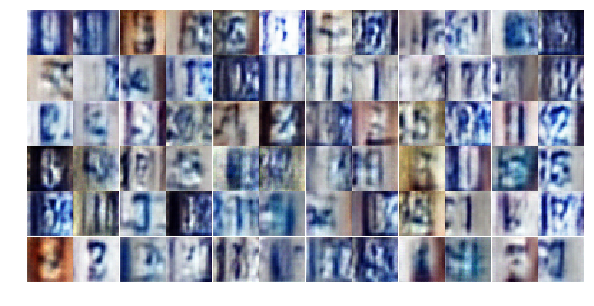

Epoch 5/6... Discriminator Loss: 0.6715... Generator Loss: 1.1652
Epoch 5/6... Discriminator Loss: 0.5716... Generator Loss: 1.6228
Epoch 5/6... Discriminator Loss: 0.4321... Generator Loss: 1.9891
Epoch 5/6... Discriminator Loss: 0.4752... Generator Loss: 1.6429
Epoch 5/6... Discriminator Loss: 0.5470... Generator Loss: 1.4308
Epoch 5/6... Discriminator Loss: 0.5214... Generator Loss: 1.5071
Epoch 5/6... Discriminator Loss: 0.7866... Generator Loss: 0.9318
Epoch 5/6... Discriminator Loss: 0.4734... Generator Loss: 1.5198
Epoch 5/6... Discriminator Loss: 1.1882... Generator Loss: 0.6339
Epoch 5/6... Discriminator Loss: 0.5038... Generator Loss: 1.9772


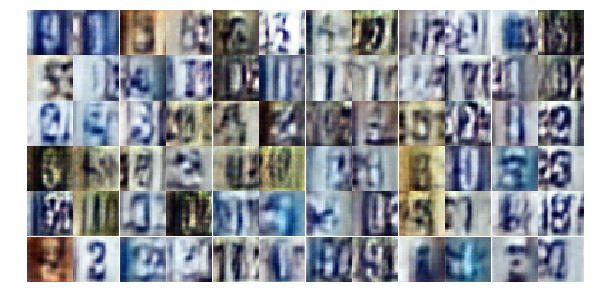

Epoch 5/6... Discriminator Loss: 0.3556... Generator Loss: 2.0401
Epoch 5/6... Discriminator Loss: 0.4719... Generator Loss: 1.3702
Epoch 5/6... Discriminator Loss: 0.6239... Generator Loss: 1.0764
Epoch 5/6... Discriminator Loss: 0.4936... Generator Loss: 1.5516
Epoch 5/6... Discriminator Loss: 0.7723... Generator Loss: 0.9954
Epoch 5/6... Discriminator Loss: 0.9938... Generator Loss: 0.6812
Epoch 5/6... Discriminator Loss: 0.5143... Generator Loss: 1.9337
Epoch 5/6... Discriminator Loss: 0.5184... Generator Loss: 2.4424
Epoch 5/6... Discriminator Loss: 0.5990... Generator Loss: 1.1418
Epoch 5/6... Discriminator Loss: 0.5126... Generator Loss: 1.8284


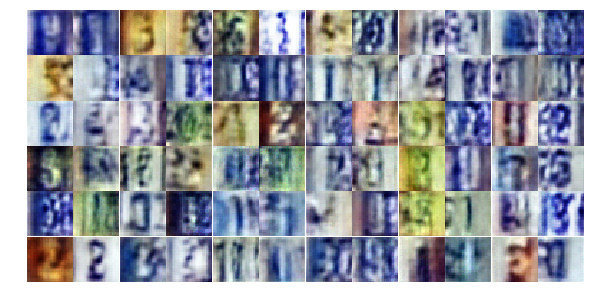

Epoch 5/6... Discriminator Loss: 0.6979... Generator Loss: 1.5251
Epoch 5/6... Discriminator Loss: 0.6811... Generator Loss: 1.1626
Epoch 5/6... Discriminator Loss: 1.0568... Generator Loss: 0.6891
Epoch 5/6... Discriminator Loss: 0.6913... Generator Loss: 2.1002
Epoch 5/6... Discriminator Loss: 0.7911... Generator Loss: 0.9215
Epoch 5/6... Discriminator Loss: 0.7503... Generator Loss: 1.4341
Epoch 6/6... Discriminator Loss: 0.9683... Generator Loss: 0.6723
Epoch 6/6... Discriminator Loss: 0.5781... Generator Loss: 1.1229
Epoch 6/6... Discriminator Loss: 0.3907... Generator Loss: 2.7164
Epoch 6/6... Discriminator Loss: 0.6479... Generator Loss: 1.3283


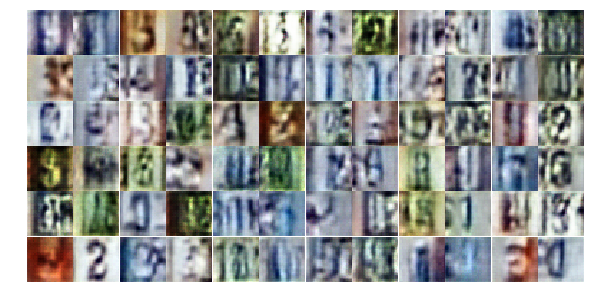

Epoch 6/6... Discriminator Loss: 0.4829... Generator Loss: 1.6119
Epoch 6/6... Discriminator Loss: 0.4727... Generator Loss: 1.9408
Epoch 6/6... Discriminator Loss: 0.6034... Generator Loss: 1.1851
Epoch 6/6... Discriminator Loss: 0.6857... Generator Loss: 1.4885
Epoch 6/6... Discriminator Loss: 0.9708... Generator Loss: 0.6450
Epoch 6/6... Discriminator Loss: 0.4377... Generator Loss: 1.4486
Epoch 6/6... Discriminator Loss: 0.4519... Generator Loss: 1.4948
Epoch 6/6... Discriminator Loss: 0.7026... Generator Loss: 1.0979
Epoch 6/6... Discriminator Loss: 0.8141... Generator Loss: 0.8053
Epoch 6/6... Discriminator Loss: 0.7027... Generator Loss: 1.1149


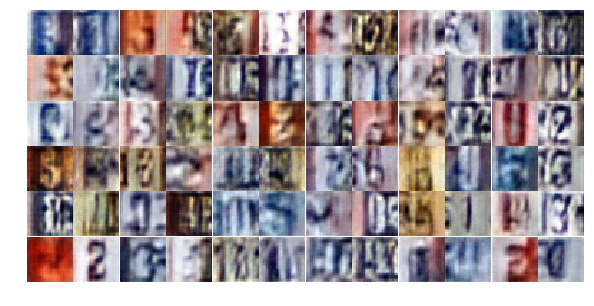

Epoch 6/6... Discriminator Loss: 0.5922... Generator Loss: 2.9199
Epoch 6/6... Discriminator Loss: 1.0647... Generator Loss: 1.2661
Epoch 6/6... Discriminator Loss: 0.8863... Generator Loss: 0.9377
Epoch 6/6... Discriminator Loss: 0.5082... Generator Loss: 1.9429
Epoch 6/6... Discriminator Loss: 0.4454... Generator Loss: 2.0055
Epoch 6/6... Discriminator Loss: 0.5268... Generator Loss: 1.6826
Epoch 6/6... Discriminator Loss: 0.5796... Generator Loss: 1.2827
Epoch 6/6... Discriminator Loss: 0.7493... Generator Loss: 1.2820
Epoch 6/6... Discriminator Loss: 0.5918... Generator Loss: 1.7874
Epoch 6/6... Discriminator Loss: 0.7951... Generator Loss: 0.9172


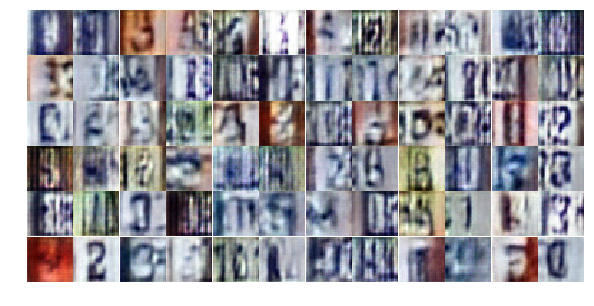

Epoch 6/6... Discriminator Loss: 0.8611... Generator Loss: 0.8309
Epoch 6/6... Discriminator Loss: 0.6344... Generator Loss: 1.2941
Epoch 6/6... Discriminator Loss: 0.6072... Generator Loss: 1.5324
Epoch 6/6... Discriminator Loss: 0.9629... Generator Loss: 0.6612
Epoch 6/6... Discriminator Loss: 0.8579... Generator Loss: 0.8756
Epoch 6/6... Discriminator Loss: 1.2321... Generator Loss: 0.5307
Epoch 6/6... Discriminator Loss: 0.6476... Generator Loss: 1.6701
Epoch 6/6... Discriminator Loss: 0.4360... Generator Loss: 1.6858
Epoch 6/6... Discriminator Loss: 0.4799... Generator Loss: 1.6186
Epoch 6/6... Discriminator Loss: 0.3634... Generator Loss: 2.1700


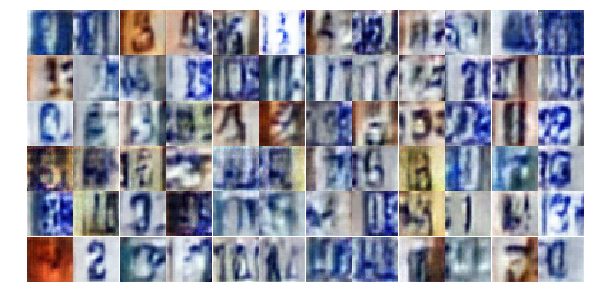

Epoch 6/6... Discriminator Loss: 0.6774... Generator Loss: 1.8156
Epoch 6/6... Discriminator Loss: 0.7009... Generator Loss: 2.4706
Epoch 6/6... Discriminator Loss: 0.7636... Generator Loss: 0.9966
Epoch 6/6... Discriminator Loss: 0.8276... Generator Loss: 0.8431
Epoch 6/6... Discriminator Loss: 1.3517... Generator Loss: 0.4573
Epoch 6/6... Discriminator Loss: 0.8521... Generator Loss: 0.7981
Epoch 6/6... Discriminator Loss: 0.4555... Generator Loss: 1.4521
Epoch 6/6... Discriminator Loss: 0.4825... Generator Loss: 1.4730
Epoch 6/6... Discriminator Loss: 0.6086... Generator Loss: 1.1501
Epoch 6/6... Discriminator Loss: 1.1728... Generator Loss: 0.4800


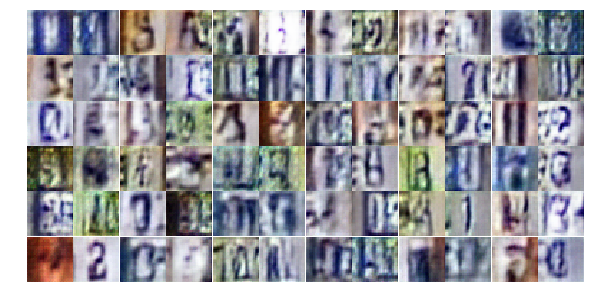

Epoch 6/6... Discriminator Loss: 1.0361... Generator Loss: 0.7052
Epoch 6/6... Discriminator Loss: 1.0677... Generator Loss: 1.4655
Epoch 6/6... Discriminator Loss: 0.9293... Generator Loss: 0.7225
Epoch 6/6... Discriminator Loss: 0.6592... Generator Loss: 1.7512
Epoch 6/6... Discriminator Loss: 0.4385... Generator Loss: 1.8609
Epoch 6/6... Discriminator Loss: 0.3942... Generator Loss: 2.0028
Epoch 6/6... Discriminator Loss: 0.7763... Generator Loss: 1.0273
Epoch 6/6... Discriminator Loss: 0.9805... Generator Loss: 0.6379
Epoch 6/6... Discriminator Loss: 0.5319... Generator Loss: 1.3052
Epoch 6/6... Discriminator Loss: 1.6066... Generator Loss: 0.3473


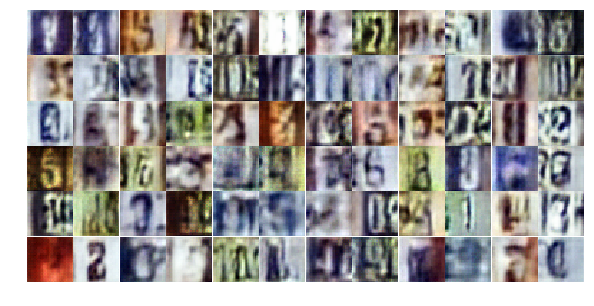

Epoch 6/6... Discriminator Loss: 0.5088... Generator Loss: 1.7482
Epoch 6/6... Discriminator Loss: 0.6135... Generator Loss: 1.0623
Epoch 6/6... Discriminator Loss: 0.5019... Generator Loss: 1.4866


In [19]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

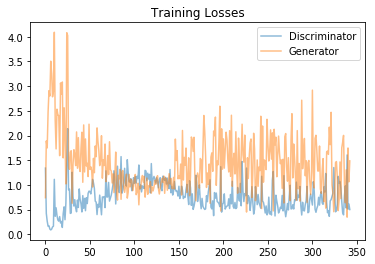

In [20]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

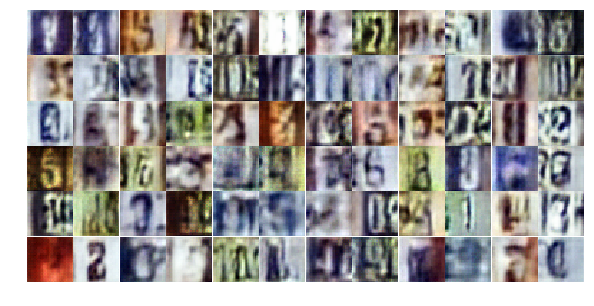

In [21]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

### Conclusion
The above shows the sample images thatdoes seem to show some of the pictures generated by the GAN , though not completely like in the exercises , they are somewhat matching , The numbers are coming into the pictures somehow , such as 2, 3, 9, 1, 6, 8, 0